In [1]:
import os
import copy
import time
import torch
import random
import torchvision
import numpy as np
import torch.nn as nn
from torch.nn import Parameter
import matplotlib.pyplot as plt
from torch.autograd import Variable
from scipy.interpolate import griddata
from scipy.ndimage import gaussian_filter
from torch.utils.data import Dataset, DataLoader
from torch.utils.data.dataset import ConcatDataset
from torch.nn.init import kaiming_normal, calculate_gain
from torch.optim.lr_scheduler import StepLR, ReduceLROnPlateau

import warnings
warnings.filterwarnings("ignore")

from model import *

In [2]:
os.environ['CUDA_VISIBLE_DEVICES']= '0'
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
if torch.cuda.is_available():
    use_gpu = torch.cuda.is_available()
    n_gpu = torch.cuda.device_count()
    print(f"GPU 数量: {n_gpu}")
print(f"运行平台: {device}")

GPU 数量: 1
运行平台: cuda


In [3]:
from utils_dataprocess import *

def discrete_point_interp_1D(points, values, inshape_range, inv=0.25, method='linear'):
    grid_x = np.meshgrid(np.arange(inshape_range[0], inshape_range[1], inv))
    grid_img = griddata(points, values, grid_x, method=method)  # method <linear、cubic、nearest>
    return grid_img

def mean_std_norm(x):
    x = (x-np.mean(x))/np.std(x)
    return x

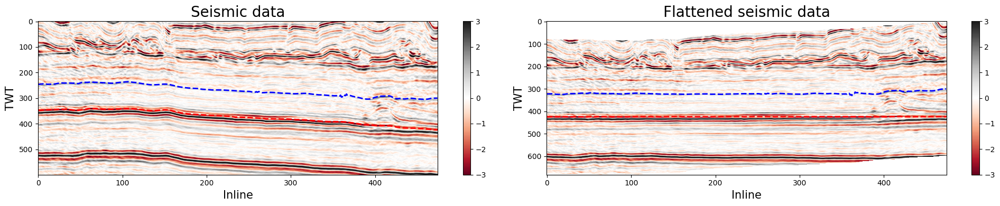

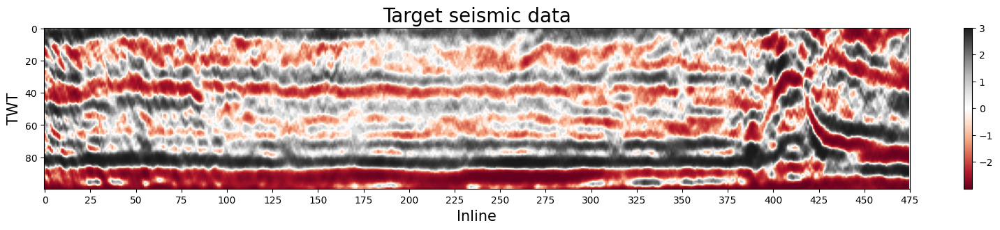

In [138]:
# load data
layer = np.fromfile("./LG_dataset/top_mh2surf.dat",dtype=np.float32).reshape((2000,475))
bottom = np.fromfile("./LG_dataset/bottom_mh2surf.dat",dtype=np.float32).reshape((2000,475))

num = 1299
sx = np.fromfile("./LG_dataset/lg_2d/"+str(num)+".dat",dtype=np.float32).reshape((475,600))
line = layer[num,:] # flat参考层位
bline = bottom[num,:] # 扫描滑动参考底界面

# flatten data
dmax = np.max(bline)
shift =  dmax - bline # 计算shift
shift = gaussian_filter1d(shift,3)
z_range = [0, sx.shape[1]+int(shift.max())]
sx_flat = np.full((sx.shape[0],z_range[1]), np.nan)

for i in range(sx.shape[0]):
    x_line = np.arange(0,sx.shape[1],1)
    valuei = sx[i,:]
    shift_depthi = np.array(x_line + shift[i])
    sx_flat[i,:] = discrete_point_interp_1D(shift_depthi,valuei,z_range,inv=1,method="cubic")

plt.figure(figsize=(20,4))
plt.subplot(1,2,1)
plt.imshow(sx.T,vmin=-3,vmax=3,cmap="RdGy",aspect="auto")
plt.colorbar()
x = np.arange(0,sx.shape[0],1)
plt.plot(x,line,"--",linewidth=2,color="b")
plt.plot(x,bline,"--",linewidth=2,color="r")
plt.title("Seismic data",fontsize=20)
plt.xlabel("Inline",fontsize=15),plt.ylabel("TWT",fontsize=15)

plt.subplot(1,2,2)
plt.imshow(sx_flat.T,vmin=-3,vmax=3,cmap="RdGy",aspect="auto")
bline = bline + shift
line = line + shift
plt.plot(x,line,"--",linewidth=2,color="b")
plt.plot(x,bline,"--",linewidth=2,color="r")
plt.title("Flattened seismic data",fontsize=20)
plt.xlabel("Inline",fontsize=15),plt.ylabel("TWT",fontsize=15)
plt.colorbar()
plt.tight_layout()

plt.figure(figsize=(20,3))
y1,y2 = int(np.mean(bline)-100),int(np.max(bline))
# plt.imshow(sx_flat[:,y1:y2].T,vmin=-3,vmax=3,cmap="RdGy",aspect="auto")
plt.imshow(amplitude_equalization(sx_flat[:,y1:y2].T),cmap="RdGy",aspect="auto")
plt.xticks([0,25,50,75,100,125,150,175,200,225,250,275,300,325,350,375,400,425,450,475])
subbline = bline - y1
# plt.plot(x,subbline,"--",linewidth=2,color="r")
plt.title("Target seismic data",fontsize=20)
plt.xlabel("Inline",fontsize=15),plt.ylabel("TWT",fontsize=15)
plt.colorbar()

In [139]:
layer[1299,400],bottom[1299,400]

(296.97565, 406.73712)

In [140]:
line[400],bline[400]

(314.50534, 424.2668)

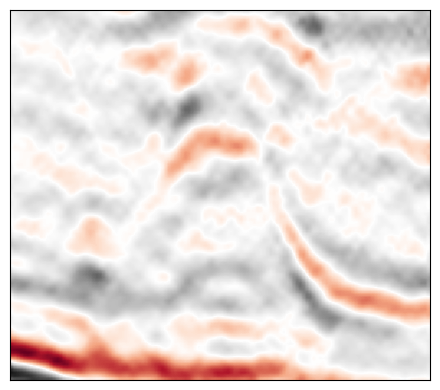

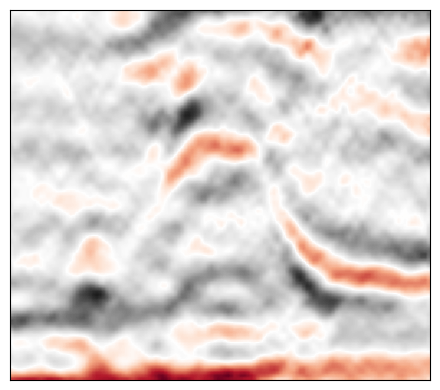

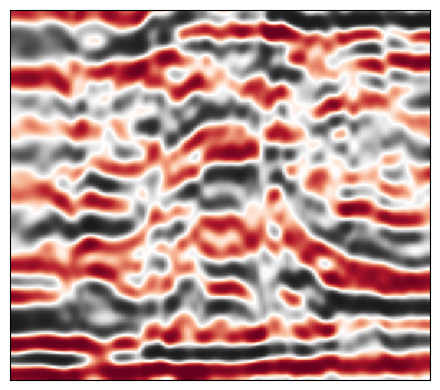

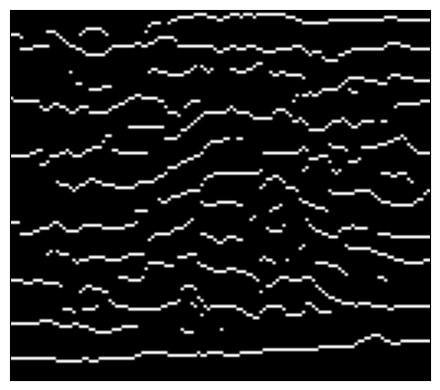

In [163]:
def data_process(x):
    x = mean_std_norm(x)
    scale = x.shape[1]/128
    x = bandpass_filter(x, 5, 30,dt=0.002/scale)
    x = dataupsample_2d(x=x,axis=0,num_up=128,method = 'cubic')
    x = dataupsample_2d(x=x,axis=1,num_up=128,method = 'cubic')
    x = amplitude_equalization(x)
    x = sos(x,nither=5)
    x = spectrum_equalization(x, 5, 30, 0.002)
    x = sos(x,nither=5)
    x = amplitude_equalization(x)
    x = mean_std_norm(x)
    peak = find_2D_peaks(x, find_through=False)
    return peak,x


plt.figure(figsize=(4.5,4))
ss = sx[375:445,300:410]
# ss = amplitude_equalization(ss)
ss = dataupsample_2d(x=ss,axis=0,num_up=128,method = 'cubic')
ss = dataupsample_2d(x=ss,axis=1,num_up=128,method = 'cubic')
plt.imshow(ss.T,cmap="RdGy",aspect="auto")
plt.xticks([]),plt.yticks([])
plt.tight_layout()

plt.figure(figsize=(4.5,4))
ss = sx_flat[375:445,315:425]
ss = dataupsample_2d(x=ss,axis=0,num_up=128,method = 'cubic')
ss = dataupsample_2d(x=ss,axis=1,num_up=128,method = 'cubic')
plt.imshow(ss.T,cmap="RdGy",aspect="auto")
plt.xticks([]),plt.yticks([])
plt.tight_layout()

plt.figure(figsize=(4.5,4))
ss = sx_flat[375:445,315:425]
ss = dataupsample_2d(x=ss,axis=0,num_up=128,method = 'cubic')
ss = dataupsample_2d(x=ss,axis=1,num_up=128,method = 'cubic')
peak,ss = data_process(ss)
plt.imshow(ss.T,cmap="RdGy",aspect="auto")
plt.xticks([]),plt.yticks([])
plt.tight_layout()

plt.figure(figsize=(4.5,4))
plt.imshow(peak.T,cmap="gray",aspect="auto")
plt.xticks([]),plt.yticks([])
plt.tight_layout()


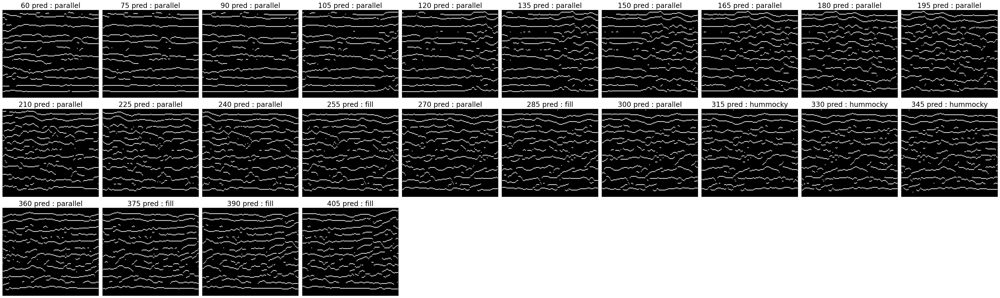

In [52]:
def data_process(x):
    x = mean_std_norm(x)
    scale = x.shape[1]/128
    x = bandpass_filter(x, 5, 30,dt=0.002/scale)
    x = dataupsample_2d(x=x,axis=0,num_up=128,method = 'cubic')
    x = dataupsample_2d(x=x,axis=1,num_up=128,method = 'cubic')
    x = amplitude_equalization(x)
    x = sos(x,nither=5)
    x = spectrum_equalization(x, 5, 30, 0.002)
    x = sos(x,nither=5)
    x = amplitude_equalization(x)
    x = mean_std_norm(x)
    peak = find_2D_peaks(x, find_through=False)
    return peak

# pred
classes = ["parallel","clinoform","fill","hummocky","chaotic"]
model = resnet50(num_classes=5)
model.load_state_dict(torch.load("./Network_path/classification_DDE_agument/checkpoint-best.pth")['state_dict'])
model.eval()
plt.figure(figsize=(40,16))
k=1
half_width = 60

for i in range(30):
    x1 = 15*i
    x2 = 15*i + half_width*2
    if x2>475:
        break
    y = int(bline[x1+half_width])
    x = sx_flat[x1:x2,y-100:y]
    x = amplitude_equalization(x)
    peak2 = data_process(x)
    with torch.no_grad():
        p = peak2.T[np.newaxis,np.newaxis,:,:]
        p = torch.tensor(torch.from_numpy(p),dtype=torch.float32)
        p = Variable(p)
        pred = model(p)
        pred = F.softmax(pred,dim=1)
        pred = torch.argmax(pred,dim=1,keepdim=True)
    plt.subplot(4,10,k)
    plt.imshow(peak2.T,cmap="gray",aspect="auto")
    plt.xticks([]),plt.yticks([])
    plt.title(str(x1 + half_width) + " pred : "+classes[pred.cpu().numpy().squeeze(0)[0]],fontsize=20)
    k = k +1
plt.tight_layout()

# 2D prediction results

In [115]:
f1 = np.full((2000,475,5), np.nan)
f2 = np.full((2000,475,5), np.nan)
p1 = np.full((2000,475), np.nan)

for i in range(1,5):
    fi = np.fromfile("./LG_dataset/"+str(i)+"_feat0_bottomflat2.dat",dtype=np.float32).reshape((2000,475,5))
    si = np.fromfile("./LG_dataset/"+str(i)+"_feat1_bottomflat2.dat",dtype=np.float32).reshape((2000,475,5))
    pi = np.fromfile("./LG_dataset/"+str(i)+"_seisp_bottomflat2.dat",dtype=np.float32).reshape((2000,475))
    x1,x2 = (i-1)*500,i*500
    if i!=1:
        x1= x1-2
        x2 = x2-2
    if i==4:
        x2 = x2+2
    print(x1,x2)
    f1[x1:x2,:,:] = fi[x1:x2,:,:]
    f2[x1:x2,:,:] = si[x1:x2,:,:]
    p1[x1:x2,:] = pi[x1:x2,:]

0 500
498 998
998 1498
1498 2000


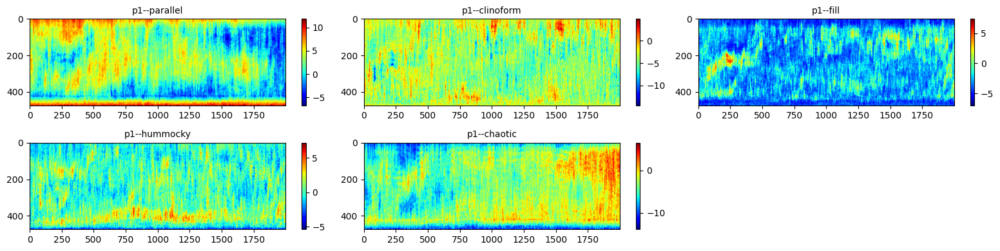

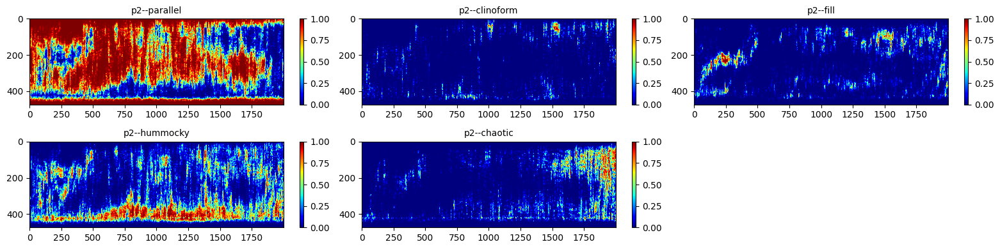

In [98]:
classes = ["parallel","clinoform","fill","hummocky","chaotic"]
plt.figure(figsize=(16,4))
for i in range(5):
    plt.subplot(2,3,i+1)
    plt.imshow(f1[:,:,i].T,cmap="jet",aspect="auto")
    plt.title("p1--"+classes[i],fontsize=10)
    plt.colorbar()
    plt.tight_layout()

classes = ["parallel","clinoform","fill","hummocky","chaotic"]
plt.figure(figsize=(16,4))
for i in range(5):
    plt.subplot(2,3,i+1)
    plt.imshow(f2[:,:,i].T,vmin=0,vmax=1,cmap="jet",aspect="auto")
    plt.title("p2--"+classes[i],fontsize=10)
    plt.colorbar()
    plt.tight_layout()

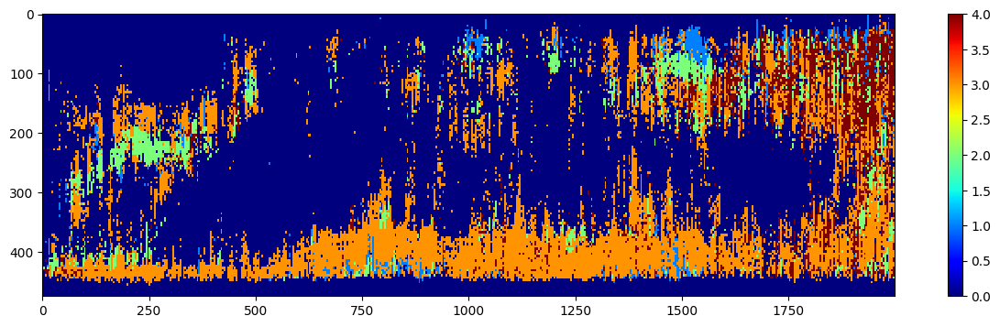

In [116]:
plt.figure(figsize=(15,4))
plt.imshow(p1.T,vmin=0,vmax=4,cmap="jet",aspect="auto",interpolation="nearest")
plt.colorbar()

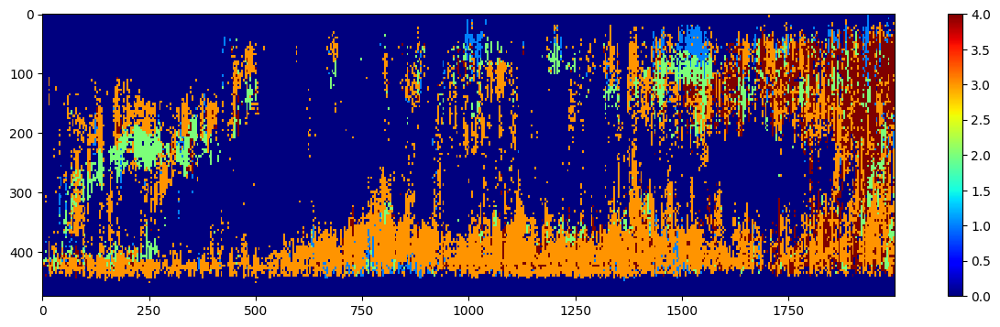

In [99]:
plt.figure(figsize=(15,4))
plt.imshow(p1.T,vmin=0,vmax=4,cmap="jet",aspect="auto",interpolation="nearest")
plt.colorbar()

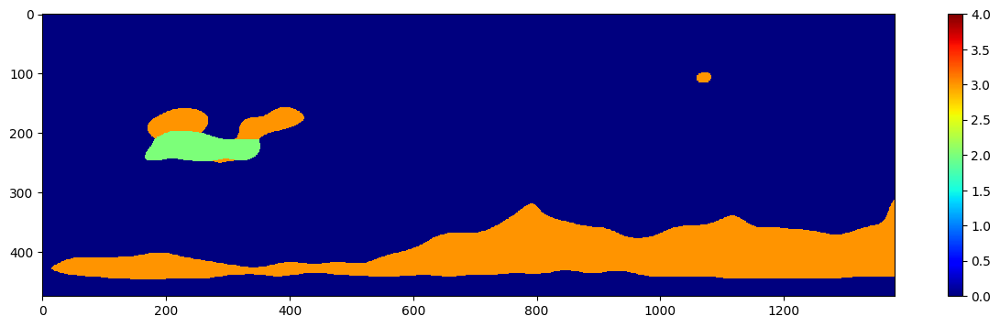

In [131]:
# smoothing result [f1 smooth->f2 smooth->p1]
f1_new = np.full((2000,475,5), np.nan)
for i in range(5):
    f1_new[:,:,i] = gaussian_filter(f1[:,:,i],(16,8))

def np_softmax(x):
    xnew = np.full(x.shape, np.nan)
    for i in range(x.shape[0]):
        for j in range(x.shape[1]):
            exp_x = np.exp(x[i,j])
            xnew[i,j] = exp_x/np.sum(exp_x)
    return xnew

f2_new = np_softmax(f1_new)
for i in range(5):
    f2_new[:,:,i] = gaussian_filter(f2_new[:,:,i],(16,8))

p1_new = np.argmax(f2_new,axis=2).astype(np.float32)

plt.figure(figsize=(15,4))
plt.imshow(p1_new[0:1380,:].T,vmin=0,vmax=4,cmap="jet",aspect="auto",interpolation="nearest")
plt.colorbar()

In [134]:
p1_new.astype(np.float32).tofile("./LG_dataset/pred_results.dat")

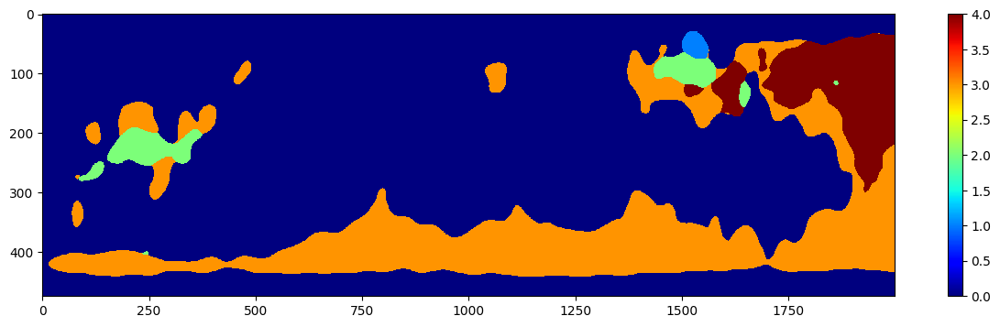

In [114]:
# smoothing result [f1 smooth->f2 smooth->p1]
f1_new = np.full((2000,475,5), np.nan)
for i in range(5):
    f1_new[:,:,i] = gaussian_filter(f1[:,:,i],(12,6))

def np_softmax(x):
    xnew = np.full(x.shape, np.nan)
    for i in range(x.shape[0]):
        for j in range(x.shape[1]):
            exp_x = np.exp(x[i,j])
            xnew[i,j] = exp_x/np.sum(exp_x)
    return xnew

f2_new = np_softmax(f1_new)
for i in range(5):
    f2_new[:,:,i] = gaussian_filter(f2_new[:,:,i],(12,6))

p1_new = np.argmax(f2_new,axis=2).astype(np.float32)

plt.figure(figsize=(15,4))
plt.imshow(p1_new.T,vmin=0,vmax=4,cmap="jet",aspect="auto",interpolation="nearest")
plt.colorbar()

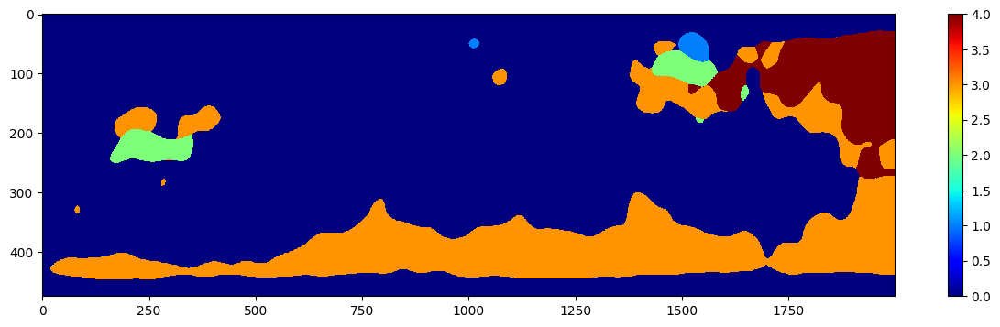

In [120]:
# smoothing result
f2_new = np.full((2000,475,5), np.nan)
for i in range(5):
    f2_new[:,:,i] = gaussian_filter(f2[:,:,i],(20,10))

p1_new = np.argmax(f2_new,axis=2).astype(np.float32)

plt.figure(figsize=(15,4))
plt.imshow(p1_new.T,vmin=0,vmax=4,cmap="jet",aspect="auto",interpolation="nearest")
plt.colorbar()

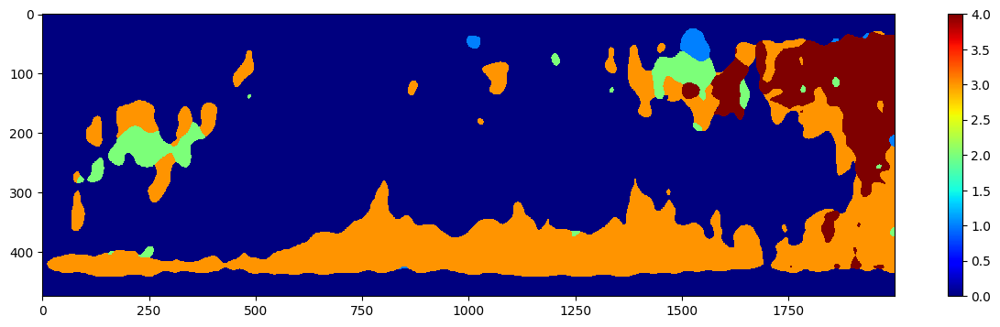

In [111]:
# smoothing result
f2_new = np.full((2000,475,5), np.nan)
for i in range(5):
    f2_new[:,:,i] = gaussian_filter(f2[:,:,i],(10,5))

p1_new = np.argmax(f2_new,axis=2).astype(np.float32)

plt.figure(figsize=(15,4))
plt.imshow(p1_new.T,vmin=0,vmax=4,cmap="jet",aspect="auto",interpolation="nearest")
plt.colorbar()

In [4]:
featf = np.full((2000,475,5), np.nan)
seisf = np.full((2000,475), np.nan)
predf = np.full((2000,475,5), np.nan)

for i in range(1,9):
    fi = np.fromfile("./LG_dataset/"+str(i)+"_feat_bottom.dat",dtype=np.float32).reshape((2000,475,5))
    si = np.fromfile("./LG_dataset/"+str(i)+"_seisf_bottom.dat",dtype=np.float32).reshape((2000,475))
    pi = np.fromfile("./LG_dataset/"+str(i)+"_predf_bottom.dat",dtype=np.float32).reshape((2000,475,5))
    x1,x2 = (i-1)*250,i*250
    featf[x1:x2,:,:] = fi[x1:x2,:,:]
    seisf[x1:x2,:] = si[x1:x2,:]
    predf[x1:x2,:,:] = pi[x1:x2,:,:]

predf.astype(np.float32).tofile("./LG_dataset/feature1_bottom.dat")
featf.astype(np.float32).tofile("./LG_dataset/feature2_bottom.dat")
seisf.astype(np.float32).tofile("./LG_dataset/pgnew_pred_bottom.dat")

In [29]:
f1 = np.fromfile("./LG_dataset/feature1_bottom.dat",dtype=np.float32).reshape((2000,475,5))
f2 = np.fromfile("./LG_dataset/feature2_bottom.dat",dtype=np.float32).reshape((2000,475,5))
p1 = np.fromfile("./LG_dataset/pgnew_pred_bottom.dat",dtype=np.float32).reshape((2000,475))

for i in range(5):
    f1[:,:,i] = gaussian_filter(f1[:,:,i],5)

def np_softmax(x):
    xnew = np.full(x.shape, np.nan)
    for i in range(x.shape[0]):
        for j in range(x.shape[1]):
            exp_x = np.exp(x[i,j])
            xnew[i,j] = exp_x/np.sum(exp_x)
    return xnew
f2 = np_softmax(f1)

# for i in range(5):
#     f2[:,:,i] = gaussian_filter(f2[:,:,i],5)

p1 = np.argmax(f2,axis=2).astype(np.float32)

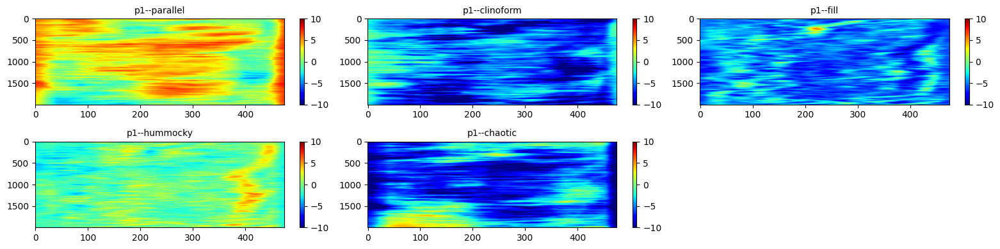

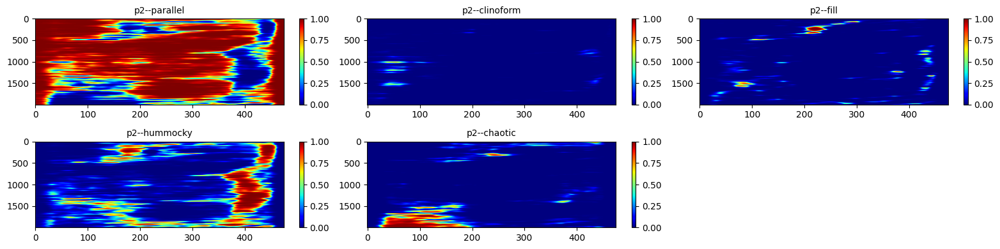

In [30]:
classes = ["parallel","clinoform","fill","hummocky","chaotic"]
plt.figure(figsize=(16,4))
for i in range(5):
    plt.subplot(2,3,i+1)
    plt.imshow(f1[:,:,i],vmin=-10,vmax=10,cmap="jet",aspect="auto")
    plt.title("p1--"+classes[i],fontsize=10)
    plt.colorbar()
    plt.tight_layout()

classes = ["parallel","clinoform","fill","hummocky","chaotic"]
plt.figure(figsize=(16,4))
for i in range(5):
    plt.subplot(2,3,i+1)
    plt.imshow(f2[:,:,i],vmin=0,vmax=1,cmap="jet",aspect="auto")
    plt.title("p2--"+classes[i],fontsize=10)
    plt.colorbar()
    plt.tight_layout()

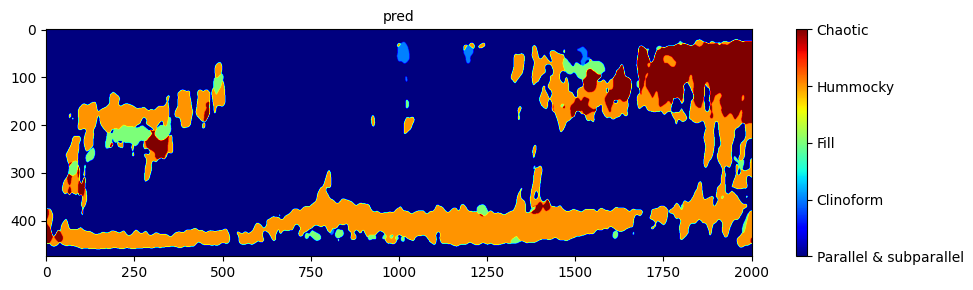

In [31]:
plt.figure(figsize=(10,3))
plt.imshow(p1.T,cmap="jet",aspect="auto",interpolation="bilinear")
plt.title("pred",fontsize=10)
plt.xticks([0,250,500,750,1000,1250,1500,1750,2000])
cbar=plt.colorbar()
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["Parallel & subparallel", "Clinoform", "Fill", "Hummocky","Chaotic"],fontsize=10)
plt.tight_layout()

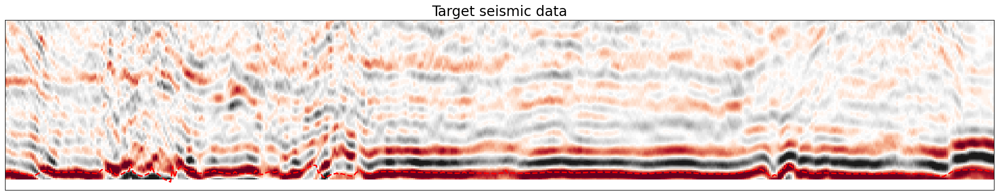

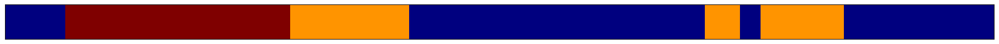

In [39]:
# load data
layer = np.fromfile("./LG_dataset/flat_mh2surf.dat",dtype=np.float32).reshape((2000,475))
bottom = np.fromfile("./LG_dataset/bottom_mh2surf.dat",dtype=np.float32).reshape((2000,475))

num = 1900
sx = np.fromfile("./LG_dataset/lg_2d/"+str(num)+".dat",dtype=np.float32).reshape((475,600))
line = layer[num,:] # flat参考层位
bline = bottom[num,:] # 扫描滑动参考底界面
# line = gaussian_filter1d(line,20)

# flatten data
# dmax = np.max(line)
# shift =  dmax - line # 计算shift

# flatten data
dmax = np.max(bline)
shift =  dmax - bline # 计算shift
shift = gaussian_filter1d(shift,5)
z_range = [0, sx.shape[1]+int(shift.max())] 
sx_flat = np.full((sx.shape[0],z_range[1]), np.nan)

for i in range(sx.shape[0]):
    x_line = np.arange(0,sx.shape[1],1)
    valuei = sx[i,:]
    shift_depthi = np.array(x_line + shift[i])
    sx_flat[i,:] = discrete_point_interp_1D(shift_depthi,valuei,z_range,inv=1,method="cubic")

bline = bline + shift
x = np.arange(0,sx.shape[0],1) 
plt.figure(figsize=(20,4))
y1,y2 = int(np.max(bline)-100),int(np.max(bline))
plt.imshow(sx_flat[:,y1:y2].T,vmin=-3,vmax=3,cmap="RdGy",aspect="auto")
subbline = bline - y1
plt.plot(x,subbline,"--",linewidth=2,color="r")
plt.title("Target seismic data",fontsize=20)
# plt.xlabel("Inline",fontsize=15),plt.ylabel("TWT",fontsize=15)
plt.xticks([]),plt.yticks([])
plt.tight_layout()

plt.figure(figsize=(20,1))
plt.imshow(p1[num,:][:,np.newaxis].T,vmin=0,vmax=4,cmap="jet",aspect="auto")
plt.xticks([]),plt.yticks([])
plt.tight_layout()

## Seismic facies prediction

In [7]:
def inline_pred(num, model, interval):
    sx = np.fromfile("./PGnew_dataset/pgnew_2d/"+str(num)+".dat",dtype=np.float32).reshape((2200,900))
    sx = np.flip(sx,0) # 原始地震数据剖面（拉平前）
    line = np.flip(layer[num,:],0) # flat参考层位
    bline = np.flip(bottom[num,:],0) # 扫描滑动参考底界面
    # flatten data
    dmax = np.max(line)
    shift =  dmax - line # 计算shift
    z_range = [0, sx.shape[1]+int(shift.max())] 
    sx_flat = np.full((sx.shape[0],z_range[1]), np.nan)
    for i in range(sx.shape[0]):
        x_line = np.arange(0,sx.shape[1],1)
        valuei = sx[i,:]
        shift_depthi = np.array(x_line + shift[i])
        sx_flat[i,:] = discrete_point_interp_1D(shift_depthi,valuei,z_range,inv=1,method="cubic")
    bline = bline + shift
    # pred by AI
    feature_maps = np.full((sx.shape[0],5), np.nan)
    pred_values = np.full((sx.shape[0],1), np.nan)
    model.eval()
    start = time.time()
    for i in range(0,sx.shape[0],interval):
        if i%interval ==0:
            timeuse =  int(time.time() - start)
            print(i,timeuse)
        peak_data = np.full((interval,128,128), np.nan)
        for m in range(interval):
            j = i+m
            x1,x2 = j-150,j+150
            y1,y2 = int(bline[j])-210,int(bline[j])-60
            if x1<0:
                x = np.zeros((int(x2-x1),int(y2-y1)))
                x[-x1:300,:] = sx_flat[0:x2,y1:y2]
                for k in range(-x1):
                    x[k,:] = sx_flat[0,y1:y2]
            elif x2>sx.shape[0]:
                x = np.zeros((int(x2-x1),int(y2-y1)))
                x[0:(sx.shape[0]-x1),:] = sx_flat[x1:sx.shape[0],y1:y2]
                for k in range(x2-sx.shape[0]):
                    x[k,:] = sx_flat[sx.shape[0]-1,y1:y2]
            else:
                x = sx_flat[x1:x2,y1:y2]
            peak1 = data_process(x)
            peak_data[m,:,:] = peak1.T
        peak_data = peak_data[:,np.newaxis,:,:]
        with torch.no_grad():
            peak_data = torch.from_numpy(peak_data)
            peak_data = torch.tensor(peak_data,dtype=torch.float32)
            peak_data = Variable(peak_data).to("cuda")
            pred = model(peak_data) 
        feature_map = F.softmax(pred,dim=1)
        pred_value = torch.argmax(feature_map,dim=1,keepdim=True)
        feature_maps[i:i+interval,:] = feature_map.cpu().numpy()
        pred_values[i:i+interval] = pred_value.cpu().numpy()
    return sx,sx_flat,feature_maps,pred_values

In [5]:
# load data
layer = np.fromfile("./PGnew_dataset/flat_sh2surf.dat",dtype=np.float32).reshape((1000,2200))
bottom = np.fromfile("./PGnew_dataset/bottom_sh2surf.dat",dtype=np.float32).reshape((1000,2200))
# load model
model = resnet50(num_classes=5)
model.load_state_dict(torch.load("./Network_path/classification_DDE/checkpoint-best.pth")['state_dict'])
model = model.cuda()
# pred
num = 400
interval = 220
sx,sx_flat,f1,p1 = inline_pred(num, model, interval)

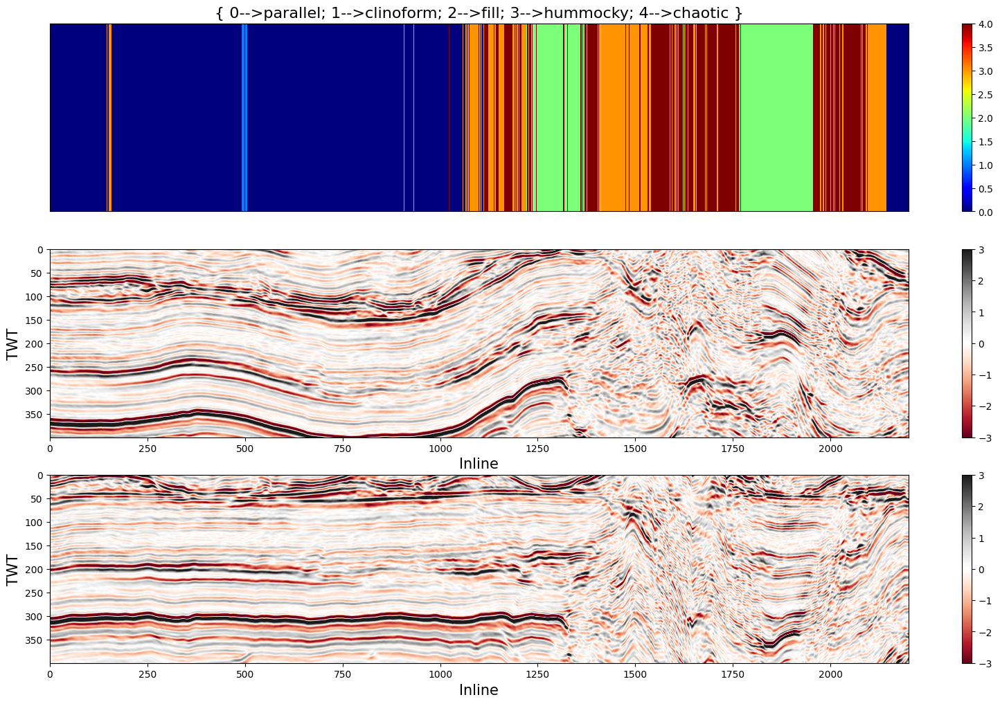

In [21]:
plt.figure(figsize=(20,12))
plt.subplot(3,1,1)
plt.imshow(p1.T,cmap="jet",interpolation="nearest",aspect="auto")
plt.xticks([]),plt.yticks([])
plt.title("{ 0-->parallel; 1-->clinoform; 2-->fill; 3-->hummocky; 4-->chaotic }",fontsize=16)
plt.colorbar()
plt.subplot(3,1,2)
plt.imshow(sx[:,300:700].T,vmin=-3,vmax=3,cmap="RdGy",aspect="auto")
plt.xlabel("Inline",fontsize=15),plt.ylabel("TWT",fontsize=15)
plt.colorbar()
plt.subplot(3,1,3)
plt.imshow(sx_flat[:,400:800].T,vmin=-3,vmax=3,cmap="RdGy",aspect="auto")
plt.xlabel("Inline",fontsize=15),plt.ylabel("TWT",fontsize=15)
plt.colorbar()


In [24]:
# featf = np.full((1000,2200,5), np.nan)
# seisf = np.full((1000,2200), np.nan)
# predf = np.full((1000,2200,5), np.nan)

# for i in range(1,11):
#     fi = np.fromfile(str(i)+"_feat.dat",dtype=np.float32).reshape((1000,2200,5))
#     si = np.fromfile(str(i)+"_seisf.dat",dtype=np.float32).reshape((1000,2200))
#     pi = np.fromfile(str(i)+"_predf.dat",dtype=np.float32).reshape((1000,2200,5))
#     x1,x2 = (i-1)*100,i*100
#     featf[x1:x2,:,:] = fi[x1:x2,:,:]
#     seisf[x1:x2,:] = si[x1:x2,:]
#     predf[x1:x2,:,:] = pi[x1:x2,:,:]

# predf.astype(np.float32).tofile("feature1.dat")
# featf.astype(np.float32).tofile("feature2.dat")
# seisf.astype(np.float32).tofile("pgnew_pred.dat")

In [103]:
f1 = np.fromfile("feature1.dat",dtype=np.float32).reshape((1000,2200,5))
f2 = np.fromfile("feature2.dat",dtype=np.float32).reshape((1000,2200,5))
p1 = np.fromfile("pgnew_pred.dat",dtype=np.float32).reshape((1000,2200))
f1[460:,:-1301,:] = np.nan
f2[460:,:-1301,:] = np.nan
p1[460:,:-1301] = np.nan

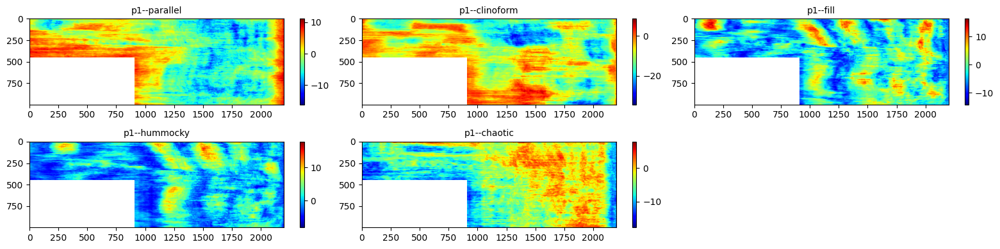

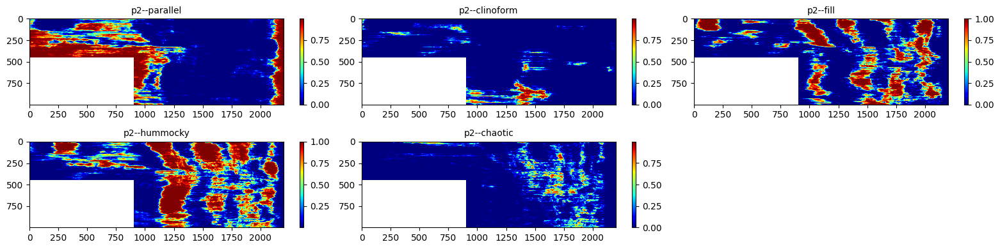

In [104]:
classes = ["parallel","clinoform","fill","hummocky","chaotic"]
plt.figure(figsize=(16,4))
for i in range(5):
    plt.subplot(2,3,i+1)
    plt.imshow(f1[:,:,i],cmap="jet",aspect="auto")
    plt.title("p1--"+classes[i],fontsize=10)
    plt.colorbar()
    plt.tight_layout()

classes = ["parallel","clinoform","fill","hummocky","chaotic"]
plt.figure(figsize=(16,4))
for i in range(5):
    plt.subplot(2,3,i+1)
    plt.imshow(f2[:,:,i],cmap="jet",aspect="auto")
    plt.title("p2--"+classes[i],fontsize=10)
    plt.colorbar()
    plt.tight_layout()

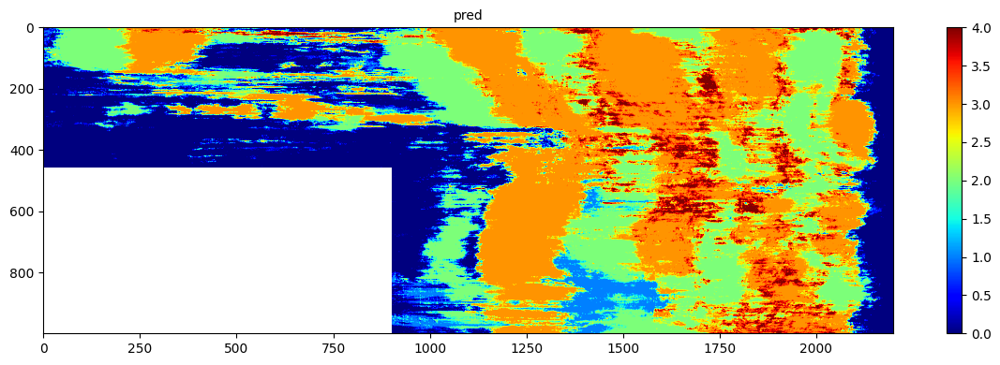

In [105]:
plt.figure(figsize=(12,4))
plt.imshow(p1,cmap="jet",aspect="auto")
plt.title("pred",fontsize=10)
plt.colorbar()
plt.tight_layout()

# smoothing f1

In [106]:
f1 = np.fromfile("feature1.dat",dtype=np.float32).reshape((1000,2200,5))
f2 = np.fromfile("feature2.dat",dtype=np.float32).reshape((1000,2200,5))
p1 = np.fromfile("pgnew_pred.dat",dtype=np.float32).reshape((1000,2200))

f_new = np.full((1000,2200,5), np.nan)
for i in range(5):
    f_new[:,:,i] = gaussian_filter(f1[:,:,i],5)

def np_softmax(x):
    xnew = np.full(x.shape, np.nan)
    for i in range(x.shape[0]):
        for j in range(x.shape[1]):
            exp_x = np.exp(x[i,j])
            xnew[i,j] = exp_x/np.sum(exp_x)
    return xnew

f2_new = np_softmax(f_new)

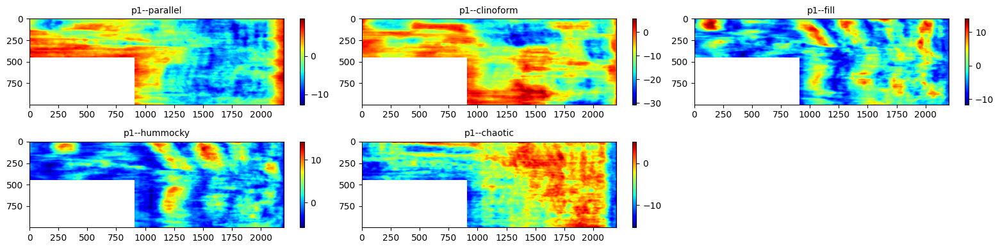

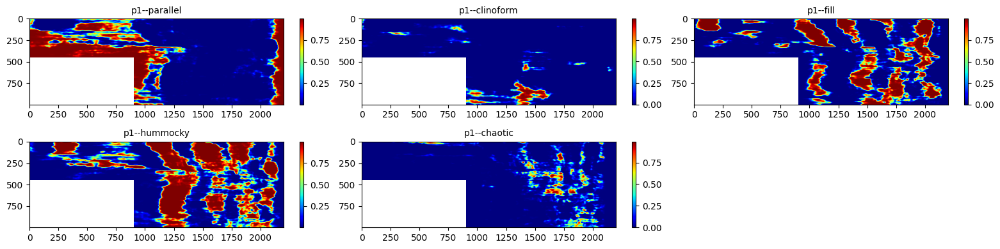

In [107]:
f_new[460:,:-1301,:] = np.nan
f2_new[460:,:-1301,:] = np.nan

classes = ["parallel","clinoform","fill","hummocky","chaotic"]
plt.figure(figsize=(16,4))
for i in range(5):
    plt.subplot(2,3,i+1)
    plt.imshow(f_new[:,:,i],cmap="jet",aspect="auto")
    plt.title("p1--"+classes[i],fontsize=10)
    plt.colorbar()
    plt.tight_layout()
    
plt.figure(figsize=(16,4))
for i in range(5):
    plt.subplot(2,3,i+1)
    plt.imshow(f2_new[:,:,i],cmap="jet",aspect="auto")
    plt.title("p1--"+classes[i],fontsize=10)
    plt.colorbar()
    plt.tight_layout()

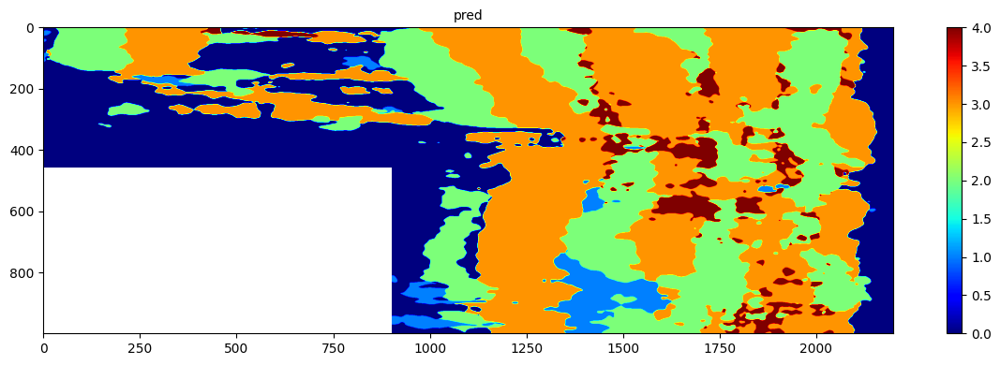

In [108]:
p1_new = np.argmax(f2_new,axis=2).astype(np.float32)
p1_new[460:,:-1301] = np.nan

plt.figure(figsize=(12,4))
plt.imshow(p1_new,cmap="jet",aspect="auto")
plt.title("pred",fontsize=10)
plt.colorbar()
plt.tight_layout()

# smoothing f2

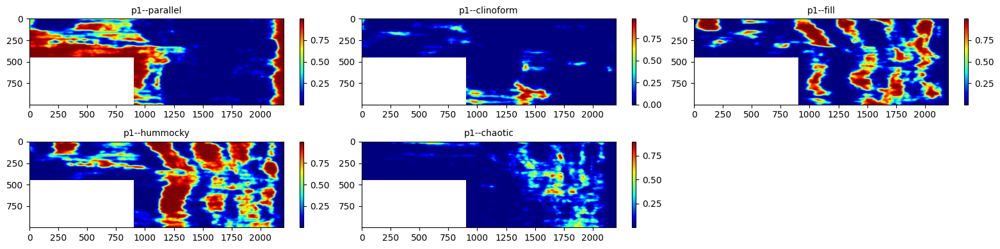

In [117]:
f1 = np.fromfile("feature1.dat",dtype=np.float32).reshape((1000,2200,5))
f2 = np.fromfile("feature2.dat",dtype=np.float32).reshape((1000,2200,5))
p1 = np.fromfile("pgnew_pred.dat",dtype=np.float32).reshape((1000,2200))

f2_new = np.full((1000,2200,5), np.nan)
for i in range(5):
    f2_new[:,:,i] = gaussian_filter(f2[:,:,i],8)
    
f2_new[460:,:-1301,:] = np.nan   
plt.figure(figsize=(16,4))
for i in range(5):
    plt.subplot(2,3,i+1)
    plt.imshow(f2_new[:,:,i],cmap="jet",aspect="auto")
    plt.title("p1--"+classes[i],fontsize=10)
    plt.colorbar()
    plt.tight_layout()


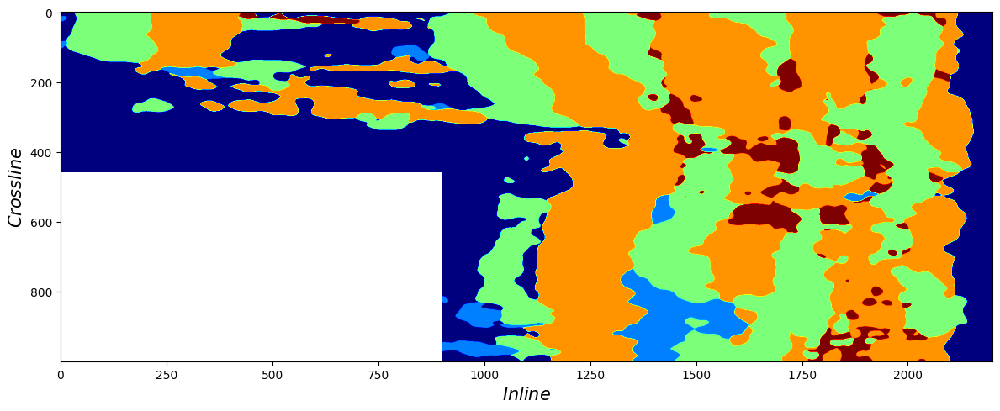

In [187]:
p1_new = np.argmax(f2_new,axis=2).astype(np.float32)
p1_new[460:,:-1301] = np.nan

plt.figure(figsize=(12,5))
plt.imshow(p1_new,cmap="jet",aspect="auto")
# plt.title("pred",fontsize=10)
plt.xlabel("$Inline$",fontsize=15),plt.ylabel("$Crossline$",fontsize=15)
# plt.colorbar()
plt.tight_layout()

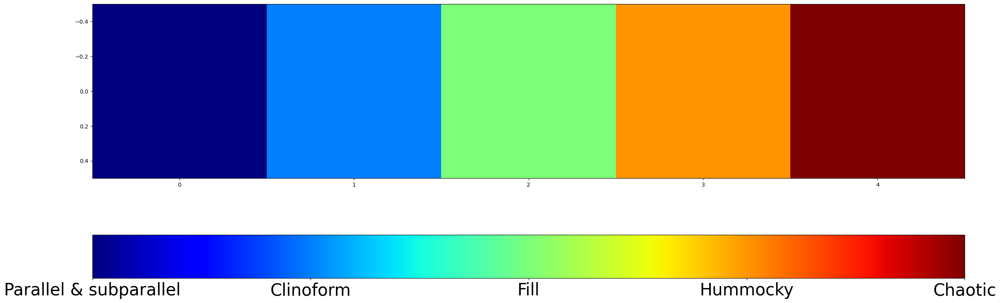

In [182]:
x = np.array([[0,1,2,3,4]])
plt.figure(figsize=(25,10))
plt.imshow(x,cmap="jet")
cbar=plt.colorbar(orientation='horizontal')
cbar.set_ticks([0,1,2,3,4])
cbar.set_ticklabels(["Parallel & subparallel", "Clinoform", "Fill", "Hummocky","Chaotic"],fontsize=30)
plt.tight_layout()

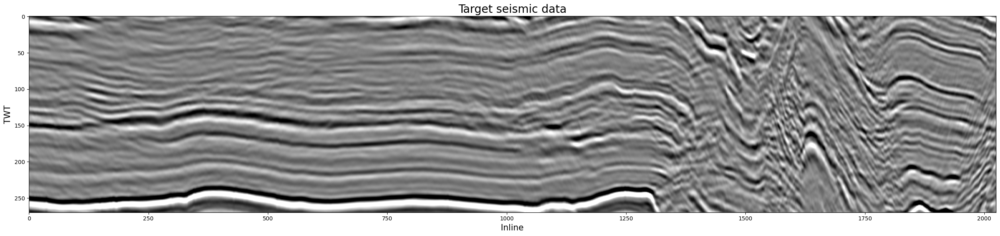

In [194]:
# load data
layer = np.fromfile("./PGnew_dataset/flat_sh2surf.dat",dtype=np.float32).reshape((1000,2200))
bottom = np.fromfile("./PGnew_dataset/bottom_sh2surf.dat",dtype=np.float32).reshape((1000,2200))

num = 460
sx = np.fromfile("./PGnew_dataset/pgnew_2d/"+str(num)+".dat",dtype=np.float32).reshape((2200,900))
sx = np.flip(sx,0) # 原始地震数据剖面（拉平前）
line = np.flip(layer[num,:],0) # flat参考层位
bline = np.flip(bottom[num,:],0) # 扫描滑动参考底界面
# line = gaussian_filter1d(line,20)

# flatten data
dmax = np.max(line)
shift =  dmax - line # 计算shift
shift = gaussian_filter1d(shift,100)
z_range = [0, sx.shape[1]+int(shift.max())] 
sx_flat = np.full((sx.shape[0],z_range[1]), np.nan)

for i in range(sx.shape[0]):
    x_line = np.arange(0,sx.shape[1],1)
    valuei = sx[i,:]
    shift_depthi = np.array(x_line + shift[i])
    sx_flat[i,:] = discrete_point_interp_1D(shift_depthi,valuei,z_range,inv=1,method="cubic")

plt.figure(figsize=(25,6))
plt.imshow(sx_flat[:-175,450:720].T,vmin=-3,vmax=3,cmap="gray",aspect="auto")
plt.title("Target seismic data",fontsize=20)
plt.xlabel("Inline",fontsize=15),plt.ylabel("TWT",fontsize=15)
plt.tight_layout()

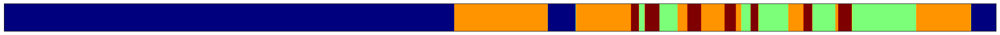

In [195]:
plt.figure(figsize=(25,1))
plt.imshow(p1_new[360,175:][:,np.newaxis].T,vmin=0,vmax=4,cmap="jet",aspect="auto")
plt.xticks([]),plt.yticks([])
plt.tight_layout()

## pred 3D

In [124]:
# load data
layer = np.fromfile("./PGnew_dataset/flat_sh2surf.dat",dtype=np.float32).reshape((1000,2200))
bottom = np.fromfile("./PGnew_dataset/bottom_sh2surf.dat",dtype=np.float32).reshape((1000,2200))
feat = np.full((layer.shape[0],layer.shape[1],5), np.nan)
seisf = np.full((layer.shape), np.nan)
# load model
model = resnet50(num_classes=5)
model.load_state_dict(torch.load("./Network_path/classification_DDE/checkpoint-best.pth")['state_dict'])

for num in range(layer.shape[0]):
    print("slice num",num)
    interval = 10
    sx,sx_flat,f1,p1 = inline_pred(num, model, interval)
    feat[num,:,:] = f1
    seisf[num,:] = p1[:,0]

pred--> 0
pred--> 500
pred--> 1000
pred--> 1500
pred--> 2000
pred--> 0


KeyboardInterrupt: 

# Predict the seismic facies demo

ValueError: 'Petrel' is not a valid value for cmap; supported values are 'Accent', 'Accent_r', 'Blues', 'Blues_r', 'BrBG', 'BrBG_r', 'BuGn', 'BuGn_r', 'BuPu', 'BuPu_r', 'CMRmap', 'CMRmap_r', 'Dark2', 'Dark2_r', 'GnBu', 'GnBu_r', 'Greens', 'Greens_r', 'Greys', 'Greys_r', 'OrRd', 'OrRd_r', 'Oranges', 'Oranges_r', 'PRGn', 'PRGn_r', 'Paired', 'Paired_r', 'Pastel1', 'Pastel1_r', 'Pastel2', 'Pastel2_r', 'PiYG', 'PiYG_r', 'PuBu', 'PuBuGn', 'PuBuGn_r', 'PuBu_r', 'PuOr', 'PuOr_r', 'PuRd', 'PuRd_r', 'Purples', 'Purples_r', 'RdBu', 'RdBu_r', 'RdGy', 'RdGy_r', 'RdPu', 'RdPu_r', 'RdYlBu', 'RdYlBu_r', 'RdYlGn', 'RdYlGn_r', 'Reds', 'Reds_r', 'Set1', 'Set1_r', 'Set2', 'Set2_r', 'Set3', 'Set3_r', 'Spectral', 'Spectral_r', 'Wistia', 'Wistia_r', 'YlGn', 'YlGnBu', 'YlGnBu_r', 'YlGn_r', 'YlOrBr', 'YlOrBr_r', 'YlOrRd', 'YlOrRd_r', 'afmhot', 'afmhot_r', 'autumn', 'autumn_r', 'binary', 'binary_r', 'bone', 'bone_r', 'brg', 'brg_r', 'bwr', 'bwr_r', 'cividis', 'cividis_r', 'cool', 'cool_r', 'coolwarm', 'coolwarm_r', 'copper', 'copper_r', 'cubehelix', 'cubehelix_r', 'flag', 'flag_r', 'gist_earth', 'gist_earth_r', 'gist_gray', 'gist_gray_r', 'gist_heat', 'gist_heat_r', 'gist_ncar', 'gist_ncar_r', 'gist_rainbow', 'gist_rainbow_r', 'gist_stern', 'gist_stern_r', 'gist_yarg', 'gist_yarg_r', 'gnuplot', 'gnuplot2', 'gnuplot2_r', 'gnuplot_r', 'gray', 'gray_r', 'hot', 'hot_r', 'hsv', 'hsv_r', 'inferno', 'inferno_r', 'jet', 'jet_r', 'magma', 'magma_r', 'nipy_spectral', 'nipy_spectral_r', 'ocean', 'ocean_r', 'pink', 'pink_r', 'plasma', 'plasma_r', 'prism', 'prism_r', 'rainbow', 'rainbow_r', 'seismic', 'seismic_r', 'spring', 'spring_r', 'summer', 'summer_r', 'tab10', 'tab10_r', 'tab20', 'tab20_r', 'tab20b', 'tab20b_r', 'tab20c', 'tab20c_r', 'terrain', 'terrain_r', 'turbo', 'turbo_r', 'twilight', 'twilight_r', 'twilight_shifted', 'twilight_shifted_r', 'viridis', 'viridis_r', 'winter', 'winter_r'

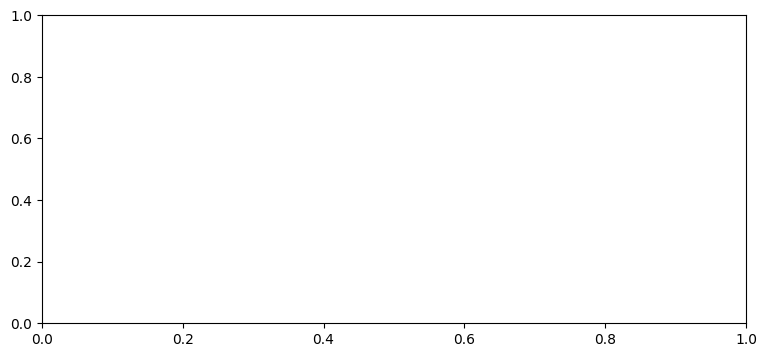

In [197]:
# load data
layer = np.fromfile("./PGnew_dataset/flat_sh2surf.dat",dtype=np.float32).reshape((1000,2200))
bottom = np.fromfile("./PGnew_dataset/bottom_sh2surf.dat",dtype=np.float32).reshape((1000,2200))

num = 900
sx = np.fromfile("./PGnew_dataset/pgnew_2d/"+str(num)+".dat",dtype=np.float32).reshape((2200,900))
sx = np.flip(sx,0) # 原始地震数据剖面（拉平前）
line = np.flip(layer[num,:],0) # flat参考层位
bline = np.flip(bottom[num,:],0) # 扫描滑动参考底界面
# line = gaussian_filter1d(line,20)

# flatten data
dmax = np.max(line)
shift =  dmax - line # 计算shift
shift = gaussian_filter1d(shift,100)
z_range = [0, sx.shape[1]+int(shift.max())] 
sx_flat = np.full((sx.shape[0],z_range[1]), np.nan)

for i in range(sx.shape[0]):
    x_line = np.arange(0,sx.shape[1],1)
    valuei = sx[i,:]
    shift_depthi = np.array(x_line + shift[i])
    sx_flat[i,:] = discrete_point_interp_1D(shift_depthi,valuei,z_range,inv=1,method="cubic")

plt.figure(figsize=(20,4))
plt.subplot(1,2,1)
plt.imshow(sx.T,vmin=-3,vmax=3,cmap="Petrel",aspect="auto")
plt.colorbar()
x = np.arange(0,sx.shape[0],1)
plt.plot(x,line,"--",linewidth=2,color="b")
plt.plot(x,bline,"--",linewidth=2,color="r")
plt.title("Seismic data",fontsize=20)
plt.xlabel("Inline",fontsize=15),plt.ylabel("TWT",fontsize=15)

plt.subplot(1,2,2)
plt.imshow(sx_flat.T,vmin=-3,vmax=3,cmap="Petrel",aspect="auto")
bline = bline + shift
line = line + shift
plt.plot(x,line,"--",linewidth=2,color="b")
plt.plot(x,bline,"--",linewidth=2,color="r")
plt.title("Flattened seismic data",fontsize=20)
plt.xlabel("Inline",fontsize=15),plt.ylabel("TWT",fontsize=15)
plt.colorbar()
plt.tight_layout()

plt.figure(figsize=(20,4))
plt.imshow(sx_flat[:,400:800].T,vmin=-3,vmax=3,cmap="Petrel",aspect="auto")
plt.title("Target seismic data",fontsize=20)
plt.xlabel("Inline",fontsize=15),plt.ylabel("TWT",fontsize=15)
plt.colorbar()

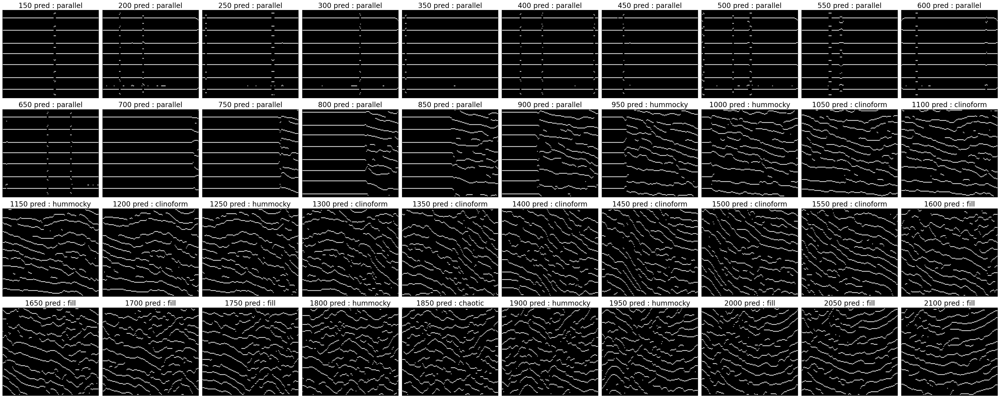

In [210]:
# pred
classes = ["parallel","clinoform","fill","hummocky","chaotic"]
model = resnet50(num_classes=5)
model.load_state_dict(torch.load("./Network_path/classification_DDE/checkpoint-best.pth")['state_dict'])
model.eval()
plt.figure(figsize=(40,16))
k=1
for i in range(40):
    x1 = 50*i
    x2 = 50*i+350
    y = int(bline[x1+175])-30
    x = sx_flat[x1:x2,y-250:y]
    peak2 = data_process(x)
    with torch.no_grad():
        p = peak2.T[np.newaxis,:,:]
        p = p[np.newaxis,:,:]
        p = torch.from_numpy(p)
        p = torch.tensor(p,dtype=torch.float32)
        p = Variable(p)
        pred = model(p)
        pred = F.softmax(pred,dim=1)
        pred = torch.argmax(pred,dim=1,keepdim=True)
    plt.subplot(4,10,k)
    plt.imshow(peak2.T,cmap="gray",aspect="auto")
    plt.xticks([]),plt.yticks([])
    plt.title(str(x1+150)+" pred : "+classes[pred.cpu().numpy().squeeze(0)[0]],fontsize=20)
    k = k +1
plt.tight_layout()